# Explainer examples

This notebook shows how you can use the `Explainer` object for interactive visualization in your jupyter notebook.

All this plotting functionality gets called by the `ExplainerDashboard` to construct the interactive dashboard.

# Google colab link:

[https://colab.research.google.com/github/oegedijk/explainerdashboard/blob/master/explainer_examples.ipynb](https://colab.research.google.com/github/oegedijk/explainerdashboard/blob/master/explainer_examples.ipynb)

uncomment and run to install explainerdashboard:

In [1]:
#!pip install explainerdashboard

# notebook properties

Display multiple outputs per cell:

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# ClassifierExplainer:

## train model

In [2]:
from sklearn.ensemble import RandomForestClassifier
from explainerdashboard.datasets import titanic_survive

X_train, y_train, X_test, y_test = titanic_survive()

model = RandomForestClassifier(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, n_estimators=50)

## build explainer

In [3]:
from explainerdashboard import ClassifierExplainer
from explainerdashboard.datasets import titanic_names, feature_descriptions

_, test_names = titanic_names() # names of passengers 

explainer = ClassifierExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'],
                                idxs=test_names, 
                                descriptions=feature_descriptions,
                                target='Survival',
                                labels=['Not survived', 'Survived'])

Note: shap=='guess' so guessing for RandomForestClassifier shap='tree'...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Detected RandomForestClassifier model: Changing class type to RandomForestClassifierExplainer...


## Importances

Get a dataframe of mean absolute shap value per feature, with onehot-encoded categorical features grouped together, and with a cutoff value of 0.01:

In [5]:
explainer.mean_abs_shap_df(cats=True, cutoff=0.01)

Calculating shap values...


,Feature,MEAN_ABS_SHAP
0,Sex,0.196648
1,Deck,0.052883
2,PassengerClass,0.040827
3,Fare,0.030360
4,No_of_relatives_on_board,0.018210
5,Embarked,0.013705
6,Age,0.012940


 Get permutation importances (decrease in metric when randomly permuting a particular feature):

In [6]:
explainer.permutation_importances_df(cats=False, topx=12)

Calculating permutation importances (if slow, try setting n_jobs parameter)...


,Feature,Importance,Score
0,Fare,0.012189,0.857567
1,No_of_relatives_on_board,-0.013483,0.883238
2,Age,-0.009869,0.879625
3,PassengerClass,0.008198,0.861558
4,No_of_siblings_plus_spouses_on_board,-0.005501,0.875256
5,No_of_parents_plus_children_on_board,-0.012728,0.882483
6,Sex_female,0.103387,0.766368
7,Sex_male,0.056844,0.812911
8,Sex_nan,0.000000,0.869755
9,Deck_A,-0.000324,0.870079


### Plot mean absolute shap importances, grouping onehotencoded:

In [4]:
explainer.plot_importances(kind='shap', topx=5, cats=True)

Calculating shap values...


### Permutation importances, not grouping categorical vars, showing top 10

In [10]:
explainer.plot_importances(kind='permutation', topx=10, cats=False)

## detailed shap summary

Only show top 10 features, group onehot-encoded categorical features:

In [11]:
explainer.plot_shap_detailed(topx=10, cats=True)

Without grouping cats:

In [13]:
explainer.plot_shap_detailed(topx=None, cats=False)

## interaction importances

### mean absolute shap interaction values for interactions with 'Sex' 
- the direct effect is usually the largest
- in this case PassengerClass shows the biggest interaction with gender

In [14]:
explainer.plot_interactions_importance('Sex', cats=True, topx=5)

Calculating shap interaction values...


In [15]:
explainer.plot_interactions_importance('Fare', cats=False, topx=5)

### Detailed shap interactions summary:

In [16]:
explainer.plot_interactions_detailed("Sex")

## Contributions

In [17]:
index = 0 # explain prediction for first row of X_test
explainer.contrib_df(index, cats=True, topx=8)

,col,contribution,value,cumulative,base
0,_BASE,0.391172,,0.391172,0
1,Sex,0.250136,female,0.641309,0.391172
2,Fare,0.0639552,71.2833,0.705264,0.641309
3,Deck,0.0561479,C,0.761412,0.705264
4,PassengerClass,0.0507533,1,0.812165,0.761412
5,Embarked,0.0379494,Cherbourg,0.850114,0.812165
6,No_of_relatives_on_board,0.0283337,1,0.878448,0.850114
7,No_of_parents_plus_children_on_board,0.00820689,0,0.886655,0.878448
8,No_of_siblings_plus_spouses_on_board,0.00595472,1,0.89261,0.886655
9,_REST,-0.00543509,,0.887175,0.89261


In [19]:
explainer.plot_contributions(index, cats=True, topx=8)

In [20]:
name = test_names[6] # explainer prediction for name
print(name)
explainer.plot_contributions(name, cats=False)

Vestrom, Miss. Hulda Amanda Adolfina


In [21]:
explainer.plot_contributions(name, cats=False, topx=10, sort='high-to-low', orientation='horizontal')

## Shap dependence plots

In [22]:
explainer.plot_dependence(")

### color by sex

In [23]:
explainer.plot_dependence(", color_col="Sex")

### color by Fare

In [24]:
explainer.plot_dependence(", color_col="Fare")

### Highlight particular index

In [25]:

explainer.plot_dependence(", color_col="Sex", highlight_index=5)

## Shap interactions plots

In [26]:
explainer.plot_interaction("Sex", "PassengerClass")

In [27]:
explainer.plot_interaction("PassengerClass", "Sex")

In [28]:
explainer.plot_interaction("Fare", "Age", highlight_index=name)

In [29]:
explainer.plot_interaction("Age", "Fare")

## partial dependence plots (pdp)

### Plot average general partial dependence plot with ice lines for specific observations

In [30]:
explainer.plot_pdp("Fare")

In [31]:
explainer.plot_pdp("Sex")

### highlight pdp for specific observation

In [32]:
name = test_names[5]
print(name)
explainer.plot_pdp("Fare", name)

Saundercock, Mr. William Henry
Calculating prediction probabilities...


### with default parameters:

In [33]:
explainer.plot_pdp("Age", index=5, drop_na=True, sample=100,
                    gridlines=100, gridpoints=10)

### adjusting parameters:

- `drop_na=False` no longer drop values equal to self.na_fill (-999 by default)
- `sample=200` sample 200 samples for calculating the average
- `gridlines=10`  display 10 additional grid lines
- `gridpoints=50` take 50 points along the x axis to calculate the lines

In [34]:
explainer.plot_pdp("Age", index=5, drop_na=False, sample=200,
                    gridlines=10, gridpoints=50)

## Classification validation plots:

In [35]:
explainer.metrics(cutoff=0.8)

{'accuracy': 0.76,
 'precision': 1.0,
 'recall': 0.3424657534246575,
 'f1': 0.5102040816326531,
 'roc_auc_score': 0.8807571998705641,
 'pr_auc_score': 0.8578670897475903,
 'log_loss': 0.4129140935196902}

In [36]:
from IPython.display import display, Markdown
display(Markdown(explainer.prediction_result_markdown(test_names[3])))

Calculating pred_percentiles...


###### Prediction:

Actual Survival: Survived

Prediction probabilities per label:

* Not survived: 41.89% 
* Survived: 58.11% 

In top 24.0% percentile probability Survived

### confusion matrix

In [37]:
explainer.plot_confusion_matrix(cutoff=0.5, normalized=False, binary=True)

#### For multiclass classifiers, `binary=False` would display e.g. a 3x3 confusion matrix
- in this case it's a binary classifier, so binary=False makes no difference

### precision plot
- if the classifier works well the predicted probability should be the same as the observed probability per bin, so we would expect a nice straight line from 0 to 1

#### based on bin size:

In [38]:
explainer.plot_precision(bin_size=0.1)

#### based on quantiles, showing all classes, adding in a cutoff value

In [39]:
explainer.plot_precision(quantiles=10, cutoff=0.75, multiclass=True)

### Cumulative precision

In [40]:
explainer.plot_cumulative_precision()

### lift curve

In [41]:
explainer.plot_lift_curve(cutoff=None, percentage=False, round=2)

In [42]:
explainer.plot_lift_curve(cutoff=0.75, percentage=True, round=2)

### Plot classification:

In [43]:
explainer.plot_classification()

In [44]:
explainer.plot_classification(cutoff=0.75, percentage=False)

### ROC AUC Curve

In [45]:
explainer.plot_roc_auc(cutoff=0.75)

### Plot PR AUC

In [46]:
explainer.plot_pr_auc(cutoff=0.25)

# RegressionExplainer

In [50]:
from explainerdashboard.datasets import titanic_fare
from sklearn.ensemble import RandomForestRegressor

X_train, y_train, X_test, y_test = titanic_fare()

model = RandomForestRegressor(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

train_names, test_names = titanic_names()

RandomForestRegressor(max_depth=5, n_estimators=50)

In [51]:
from explainerdashboard.datasets import titanic_fare, titanic_names, feature_descriptions
from explainerdashboard import RegressionExplainer

train_names, test_names = titanic_names()

explainer = RegressionExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'], 
                                idxs=test_names, 
                                target='Fare',
                                descriptions=feature_descriptions,
                                units="$")

Note: shap=='guess' so guessing for RandomForestRegressor shap='tree'...
Generating self.shap_explainer = shap.TreeExplainer(model)
Changing class type to RandomForestRegressionExplainer...


## Importances

### Mean absolute shap importances, grouping onehotencoded:

In [52]:
explainer.plot_importances(kind='shap', topx=5, cats=True, round=3)

Calculating shap values...


### Permutation importances, not grouping categorical vars, showing top 10

In [53]:
explainer.plot_importances(kind='permutation', topx=10, cats=False, round=3)

Calculating importances...


## detailed shap summary

In [54]:
explainer.plot_shap_detailed(topx=10, cats=True)

In [55]:
explainer.plot_shap_detailed(topx=None, cats=False)

## interaction importances

### mean absolute shap interaction values for interactions with 'Sex' 
- the direct effect is usually the largest
- in this case PassengerClass shows the biggest interaction with gender

In [56]:
explainer.plot_interactions_importance('Sex', cats=True, topx=5)

Calculating shap interaction values...


In [57]:
explainer.plot_interactions_importance('Age', cats=False, topx=5)

### Detailed shap interactions summary:

In [58]:
explainer.plot_interactions_detailed("Sex", cats=True)

## Contributions

In [59]:
index = 0 # explain prediction for first row of X_test
explainer.plot_contributions(index, cats=True, topx=8, round=2)

In [60]:
name = test_names[0] # explainer prediction for name
print(name)
explainer.plot_contributions(name, cats=False, sort='low-to-high', orientation='horizontal')

Cumings, Mrs. John Bradley (Florence Briggs Thayer)


## Shap dependence plots

In [61]:
explainer.plot_dependence(")

### color by sex

In [62]:
explainer.plot_dependence(", color_col="Sex")

### color by PassengerClass

In [63]:
explainer.plot_dependence(", color_col="PassengerClass")

### Highlight particular index

In [64]:

explainer.plot_dependence(", color_col="Sex", highlight_index=5)

## Shap interactions plots

In [65]:
explainer.plot_interaction("Sex", "PassengerClass")

In [66]:
explainer.plot_interaction("PassengerClass", "Sex")

In [67]:
explainer.plot_interaction("PassengerClass", "Age", highlight_index=5)

In [68]:
explainer.plot_interaction("Age", "PassengerClass")

## partial dependence plots (pdp)

### Plot average general partial dependence plot with ice lines for specific observations

In [69]:
explainer.plot_pdp("PassengerClass")

In [70]:
explainer.plot_pdp("Deck")

### highlight pdp for specific observation

In [71]:
name = test_names[17]
print(name)
explainer.plot_pdp("PassengerClass", name)

Hood, Mr. Ambrose Jr
Calculating predictions...


### with default parameters:

In [72]:
explainer.plot_pdp("PassengerClass", index=17, drop_na=True, sample=100,
                    gridlines=100, gridpoints=10)

### adjusting parameters:

- `drop_na=False` no longer drop values equal to self.na_fill (-999 by default)
- `sample=200` sample 200 samples for calculating the average
- `gridlines=10`  display 10 additional grid lines
- `gridpoints=50` take 50 points along the x axis to calculate the lines

In [73]:
explainer.plot_pdp("PassengerClass", index=17, drop_na=False, sample=200,
                    gridlines=10, gridpoints=50)

## Regression validation plots:

In [74]:
explainer.metrics()

{'rmse': 26.109538415667945,
 'mae': 11.699703987700838,
 'R2': 0.5334209678009418}

In [75]:
from IPython.display import display, Markdown
display(Markdown(explainer.prediction_result_markdown(test_names[3])))

Calculating residuals...
Calculating prediction percentiles...


###### Prediction:
Predicted Fare: 18.0 $

Actual Fare: 11.13 $

Residual: -6.87 $


In top 44.0% percentile predicted Fare

### predicted vs actual

In [76]:
explainer.plot_predicted_vs_actual()

In [77]:
explainer.plot_predicted_vs_actual(log_x=True, log_y=True)

### plot residuals

In [78]:
explainer.plot_residuals()

In [79]:
explainer.plot_residuals(vs_actual=True, residuals='ratio')

In [80]:
explainer.plot_residuals(vs_actual=True, residuals='log-ratio')

### residuals vs specific feature

In [81]:
explainer.plot_residuals_vs_feature("Age")

# RandomForestExplainer

For RandomForest models, the class type gets recast to either a `RandomForestClassifierExplainer` or a `RandomForestRegressionExplainer`, which provide some additional functionality to visualize the individual trees in the RandomForest.

In [84]:
from sklearn.ensemble import RandomForestClassifier
from explainerdashboard.datasets import titanic_survive, titanic_names, feature_descriptions

X_train, y_train, X_test, y_test = titanic_survive()
train_names, test_names = titanic_names()

model = RandomForestClassifier(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = ClassifierExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'], 
                                idxs=test_names)

RandomForestClassifier(max_depth=5, n_estimators=50)

Note: shap=='guess' so guessing for RandomForestClassifier shap='tree'...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Changing class type to RandomForestClassifierExplainer...


In [85]:
name = test_names[20]
print(name)# first row of X_test
explainer.plot_trees(name, highlight_tree=20)

Christmann, Mr. Emil


In [86]:
explainer.decisionpath_df(tree_idx=20, index=name)

Generating ShadowDecTree for each individual decision tree...


,node_id,average,feature,value,split,direction,left,right,diff
0,0,0.369030,Sex_male,1.0,0.5,right,0.765217,0.171367,-0.197664
1,26,0.171367,No_of_parents_plus_children_on_board,0.0,0.5,left,0.129870,0.381579,-0.041496
2,27,0.129870,Deck_E,0.0,0.5,left,0.117333,0.600000,-0.012537
3,28,0.117333,Deck_Unkown,1.0,0.5,right,0.285714,0.100000,-0.017333
4,32,0.100000,PassengerClass,3.0,2.5,right,0.134831,0.087649,-0.012351


In [87]:
decisiontree_df = explainer.decisionpath_summary_df(tree_idx=5, index=name)
decisiontree_df

,Feature,Condition,Adjustment,New Prediction
0,,,Starting average,36.03%
1,PassengerClass,3.0 >= 2.5,-15.14%,20.89%
2,No_of_relatives_on_board,0.0 < 3.5,+3.3%,24.19%
3,Sex_male,1.0 >= 0.5,-8.95%,15.25%
4,Deck_Unkown,1.0 >= 0.5,-0.63%,14.61%
5,Age,29.0 < 32.5,+2.9%,17.51%
6,,,Final Prediction,17.51%


## decision_path
- this graphic is generated by dtreeviz
- See https://explained.ai/decision-tree-viz/index.html for more of the thinking behind this visualization
- dtreeviz generates an SVG gile that gets saved to disk
- but you need a working installation of graphviz for this to work
- Would be nice to turn this into a react component!


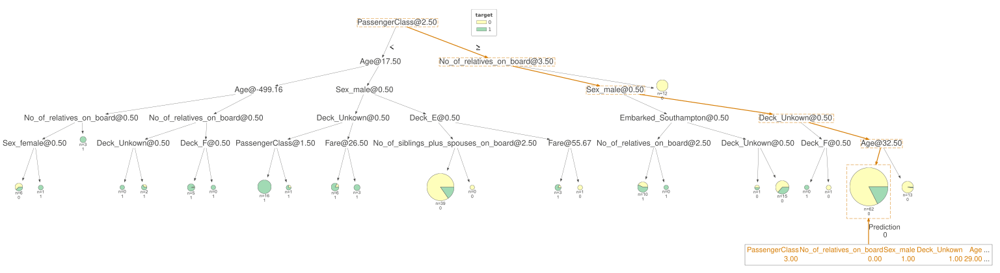

In [88]:
explainer.decisiontree(tree_idx=5, index=name)